In [1]:
import sys, os
import shutil
import getpass
import requests
import zipfile
import pyzipcode
# import dbf
import pulp
import rtree
import geopandas
import pathlib  # file creation time
import hashlib  # md5

import matplotlib.pyplot as plt
import contextily as ctx
import pandas as pd

from allagash import Problem, Coverage  # TODO: explore pyspatialopt library, MECP model as an alternative
from datetime import datetime  # runtime
# from cartopy import crs as ccrs

In [2]:
os.environ["PYSPARK_PYTHON"] = sys.executable
cbc_dir = shutil.which("cbc", path=os.path.dirname(os.environ["PYSPARK_PYTHON"]))
solver = pulp.COIN(path=cbc_dir)
# solver = pulp.GLPK()

### Testing MEXCLP Implementation With Original Paper (Daskin, 1983) Example
Example on page 55 (8 of pdf): <br>
https://daskin.engin.umich.edu/wp-content/uploads/sites/133/2014/07/daskin_mexclpts1983_.pdf

In [3]:
# manually program the problem into pulp

def manual_run_daskin_mexclp_ex(p, solver):
    """
    Manually enters the MEXCLP example from the Daskin paper into pulp, solves using the provided solver,
    and returns the solved pulp problem. Note that variable names X, y and busy fraction parameter p match
    those in the original paper. The purpose of this function is to provide insight into the specific
    equations the allagash MEXCLP implementation is entering into pulp.
    
    :param p: The busy fraction
    :param solver: LP solver supported by pulp (e.g. pulp.COIN(), pulp.GLPK())
    :return: Solved pulp problem using the solver
    :rtype: <class 'pulp.pulp.LpProblem'>
    """
    prob = pulp.LpProblem("MEXCLP", pulp.LpMaximize)

    # X_i = number of facilities at location i
    X_A = pulp.LpVariable("X_A", 0, 2, pulp.LpInteger)
    X_B = pulp.LpVariable("X_B", 0, 2, pulp.LpInteger)
    X_C = pulp.LpVariable("X_C", 0, 2, pulp.LpInteger)
    X_D = pulp.LpVariable("X_D", 0, 2, pulp.LpInteger)
    X_E = pulp.LpVariable("X_E", 0, 2, pulp.LpInteger)
    X_F = pulp.LpVariable("X_F", 0, 2, pulp.LpInteger)

    # y_j_k = 1 iff node k is covered by at least j facilities (else = 0)
    y_1_A = pulp.LpVariable("y_1_A", 0, 1, pulp.LpInteger)
    y_2_A = pulp.LpVariable("y_2_A", 0, 1, pulp.LpInteger)
    y_1_B = pulp.LpVariable("y_1_B", 0, 1, pulp.LpInteger)
    y_2_B = pulp.LpVariable("y_2_B", 0, 1, pulp.LpInteger)
    y_1_C = pulp.LpVariable("y_1_C", 0, 1, pulp.LpInteger)
    y_2_C = pulp.LpVariable("y_2_C", 0, 1, pulp.LpInteger)
    y_1_D = pulp.LpVariable("y_1_D", 0, 1, pulp.LpInteger)
    y_2_D = pulp.LpVariable("y_2_D", 0, 1, pulp.LpInteger)
    y_1_E = pulp.LpVariable("y_1_E", 0, 1, pulp.LpInteger)
    y_2_E = pulp.LpVariable("y_2_E", 0, 1, pulp.LpInteger)
    y_1_F = pulp.LpVariable("y_1_F", 0, 1, pulp.LpInteger)
    y_2_F = pulp.LpVariable("y_2_F", 0, 1, pulp.LpInteger)

    # add objective
    to_sum = [(1-p)*(p)**(1-1)*1*y_1_A, (1-p)*(p)**(2-1)*1*y_2_A,
              (1-p)*(p)**(1-1)*1*y_1_B, (1-p)*(p)**(2-1)*1*y_2_B, 
              (1-p)*(p)**(1-1)*1*y_1_C, (1-p)*(p)**(2-1)*1*y_2_C,
              (1-p)*(p)**(1-1)*5*y_1_D, (1-p)*(p)**(2-1)*5*y_2_D, 
              (1-p)*(p)**(1-1)*3*y_1_E, (1-p)*(p)**(2-1)*3*y_2_E,
              (1-p)*(p)**(1-1)*10*y_1_F, (1-p)*(p)**(2-1)*10*y_2_F]
    prob += pulp.lpSum(to_sum)
    
    # coverage constraints
    prob += y_1_A + y_2_A <= X_A + X_C + X_D
    prob += y_1_B + y_2_B <= X_B + X_C + X_E
    prob += y_1_C + y_2_C <= X_A + X_B + X_C
    prob += y_1_D + y_2_D <= X_A + X_D + X_F
    prob += y_1_E + y_2_E <= X_B + X_E + X_F
    prob += y_1_F + y_2_F <= X_D + X_E + X_F

    # Number of supply locations
    prob += X_A + X_B + X_C + X_D + X_E + X_F <= 2

    prob.solve(solver)
    return prob

def get_selected_locations(problem):
    """
    Retrieves the selected supply locations from the (solved) Daskin MEXCLP example.
    
    :param problem: The <class 'pulp.pulp.LpProblem'> object obtained from calling manual_run_daskin_mexclp_ex()
    :return: List of selected supply locations
    """
    selected_locations = []
    for var in problem.variables():
        if var.name.split("_")[0] == "X":
            if var.varValue == 1:
                selected_locations.append(var.name.split("_")[1])
            elif var.varValue == 2:  # same supply location selected twice
                selected_locations = [var.name.split("_")[1] for i in range(2)]
    return selected_locations

p = 0
daskin_p = [0.05, 0.15, 0.25, 0.35]  # specific busy fractions Daskin highlights in his example (printed in bold)

while p < 0.5:
    p = round(p, 2)
    solved_problem = manual_run_daskin_mexclp_ex(p, solver)
    selected_locations = get_selected_locations(solved_problem)
    optimized_objective = round(pulp.value(solved_problem.objective), 4)
    
    if p in daskin_p:
        print(f"p = {p}: optimized objective function = \033[1m{optimized_objective}\033[0m, selected locations = \033[1m{selected_locations}\033[0m")
    else:
        print(f"p = {p}: optimized objective function = {optimized_objective}, selected locations = {selected_locations}")
    if p == 0.1 or p == 0.2 or p == 0.3:
        print('-'*82)
        
    p += 0.05

p = 0: optimized objective function = 21.0, selected locations = ['B', 'D']
p = 0.05: optimized objective function = 19.95, selected locations = ['B', 'D']
p = 0.1: optimized objective function = 18.9, selected locations = ['B', 'D']
----------------------------------------------------------------------------------
p = 0.15: optimized objective function = 18.275, selected locations = ['D', 'E']
p = 0.2: optimized objective function = 17.6, selected locations = ['D', 'E']
----------------------------------------------------------------------------------
p = 0.25: optimized objective function = 17.0625, selected locations = ['D', 'F']
p = 0.3: optimized objective function = 16.45, selected locations = ['D', 'F']
----------------------------------------------------------------------------------
p = 0.35: optimized objective function = 15.795, selected locations = ['F', 'F']
p = 0.4: optimized objective function = 15.12, selected locations = ['F', 'F']
p = 0.45: optimized objective functio

Note that the bolded optimized objective function values and selected locations above match those at the bottom of page 56 (9 of pdf) in the Daskin paper. Now to check the allagash implementation of the MEXCLP model we show that (1) MEXCLP agrees with MCLP for p=0, and (2) MEXCLP agrees with Daskin for select values of p ∈ [0, 1).

In [4]:
# program into pulp using allagash mexclp implementation

coverage_matrix_dict = {
    "demand_id_col": ["A", "B", "C", "D", "E", "F"],
    "demand":        [1, 1, 1, 5, 3, 10],
    "A":             [True, False, True, True, False, False],
    "B":             [False, True, True, False, True, False],
    "C":             [True, True, True, False, False, False],
    "D":             [True, False, False, True, False, True],
    "E":             [False, True, False, False, True, True],
    "F":             [False, False, False, True, True, True]
}  # generated manually from diagram and critical distance D=9

coverage_df = pd.DataFrame.from_dict(coverage_matrix_dict)
coverage_df.set_index("demand_id_col", inplace=True)
coverage = Coverage(coverage_df, demand_col="demand")

p = 0

while p < 0.5:
    p = round(p, 2)
    
    if p == 0:  # show that MCLP = MEXCLP for p = 0
        mclp_problem = Problem.mclp(coverage, max_supply={coverage:2})
        mclp_problem.solve(solver)
        selected_locations = mclp_problem.selected_supply(coverage)
        optimized_objective = round(pulp.value(mclp_problem._pulp_problem.objective), 4)
        print(f"p = {p} (MCLP): optimized objective function = {optimized_objective}, selected locations = {selected_locations}")
    
    mexclp_problem = Problem.mexclp(p, coverage, max_supply={coverage:2})
    mexclp_problem.solve(solver)
    selected_locations = mexclp_problem.selected_supply(coverage)
    optimized_objective = round(pulp.value(mexclp_problem._pulp_problem.objective), 4)
    
    if p in daskin_p:
        print(f"p = {p} (MEXCLP): optimized objective function = \033[1m{optimized_objective}\033[0m, selected locations = \033[1m{selected_locations}\033[0m")
    else:
        print(f"p = {p} (MEXCLP): optimized objective function = {optimized_objective}, selected locations = {selected_locations}")
    if p == 0.1 or p == 0.2 or p == 0.3:
        print("-"*91)
        
    p += 0.05

p = 0 (MCLP): optimized objective function = 21.0, selected locations = ['B', 'D']
p = 0 (MEXCLP): optimized objective function = 21.0, selected locations = ['B', 'D']
p = 0.05 (MEXCLP): optimized objective function = 19.95, selected locations = ['B', 'D']
p = 0.1 (MEXCLP): optimized objective function = 18.9, selected locations = ['B', 'D']
-------------------------------------------------------------------------------------------
p = 0.15 (MEXCLP): optimized objective function = 18.275, selected locations = ['D', 'E']
p = 0.2 (MEXCLP): optimized objective function = 17.6, selected locations = ['D', 'E']
-------------------------------------------------------------------------------------------
p = 0.25 (MEXCLP): optimized objective function = 17.0625, selected locations = ['D', 'F']
p = 0.3 (MEXCLP): optimized objective function = 16.45, selected locations = ['D', 'F']
-------------------------------------------------------------------------------------------
p = 0.35 (MEXCLP): optim

### Use MEXCLP Implementation to Graph Optimal Air Ambulance Locations

In [5]:
DEMAND_COL = "PATIENTS"

zcdb = pyzipcode.ZipCodeDatabase()

user = getpass.getuser()
working_dir = "/home/" + user + "/mexclp/"
data_dir = working_dir + "data/"
output_dir = working_dir + "output/"
coverage_dir = data_dir + "coverage/"
demand_dir = data_dir + "demand/"

zipped = "zip:///"
utm = "EPSG:2163"  # US

year = 2016  

In [6]:
def download_file(url, destination_dir, name):
    print(f"Downloading file {name} to {destination_dir}")
    os.chdir(destination_dir)
    downloaded_file = requests.get(url)
    with open(name, "wb") as file:
        file.write(downloaded_file.content)

# make directory structure
if not os.path.isdir(data_dir):
    os.mkdir(data_dir)
if not os.path.isdir(output_dir):
    os.mkdir(output_dir)
if not os.path.isdir(coverage_dir):
    os.mkdir(coverage_dir)
if not os.path.isdir(demand_dir):
    os.mkdir(demand_dir)

data_dict = {
    coverage_dir: [("HSA_Bdry__AK_HI_unmodified.zip", "https://data.dartmouthatlas.org/downloads/geography/HSA_Bdry__AK_HI_unmodified.zip"),
                   ("HsaBdry_AK_HI_unmodified.MID", None),
                   ("HsaBdry_AK_HI_unmodified.MIF", None),
                   ("tl_2016_us_zcta510.zip", "https://www2.census.gov/geo/tiger/TIGER2016/ZCTA5/tl_2016_us_zcta510.zip")],
    demand_dir:   [("gaz2016zcta5centroid.csv", "https://nber.org/distance/2016/gaz/zcta5/gaz2016zcta5centroid.csv"),
                   ("ZipHsaHrr16.xls", "https://atlasdata.dartmouth.edu/downloads/geography/ZipHsaHrr16.xls"),
                   ("HSAF2016.zip", "https://www.cms.gov/Research-Statistics-Data-and-Systems/Statistics-Trends-and-Reports/Hospital-Service-Area-File/Download/HSAF2016.zip")]
}

for dir_name in data_dict:
    list_of_tuples = data_dict[dir_name]
    for data_tuple in list_of_tuples:
        file, url = data_tuple[0], data_tuple[1]
        if not os.path.exists(dir_name + file):
            if url is not None:
                download_file(url, dir_name, file)
                if file[len(file)-3:] == "zip" and file != data_dict[coverage_dir][0][0]:
                    print(f"Extracting file {file}")
                    with zipfile.ZipFile(dir_name + file, "r") as zip_ref:
                        zip_ref.extractall(dir_name)
            else:  # separate procedure for extracting these two MID and MIF files because we are not extracting everything from the zip
                if file[len(file)-3:] == "MID":  # only print message once
                    print(f"Extracting file {data_dict[dir_name][0][0]}")
                with zipfile.ZipFile(dir_name + data_dict[dir_name][0][0]) as z:
                    with z.open(data_dict[dir_name][0][0][:26] + "/hsa-mapinfo/" + file) as zf, open(dir_name + file, "wb") as f:
                        shutil.copyfileobj(zf, f)

Extracting file HSA_Bdry__AK_HI_unmodified.zip
Extracting file tl_2016_us_zcta510.zip
Extracting file HSAF2016.zip


In [7]:
def get_max_locations(state, defaults=None):
    state_specific = { # hard-coded values from 2019 ADAMS (AAMS)
        "FL": 34,
        "TX": 95,
        "NY": 23,
        "MA": 6,
        "VA": 18,
    }
    if isinstance(defaults, list):
        return defaults
    
    for potential_dict in [defaults, state_specific]:
        if isinstance(potential_dict, dict) and (state in potential_dict):
            return [potential_dict[state]]
        
    return defaults

def setup_state(states, busy_fractions=None, max_flying_times=None, max_distance=None, max_locations=None, units=None,
                constant_speed_kt=140, solvers=["cbc"], combine=False, existing=None):
    if isinstance(states, str):
        states = [states]
    epsg = {
        "FL": "EPSG:3086",
        "TX": "EPSG:3081",
        "NY": "EPSG:26918",
        "VA": "EPSG:3970",
    }
    
    if max_distance is None and max_flying_times is not None:
        if not isinstance(max_flying_times, list):
            max_flying_times = [max_flying_times]
        max_orig = max_flying_times
        units_orig = "min"
        max_distance = [1852 * constant_speed_kt/60 * t for t in max_flying_times]
    else:
        if not isinstance(max_distance, list):
            max_distance = [max_distance]
        max_orig = max_distance
        units_orig = "nm"
        max_distance = [1852 * nm for nm in max_distance]

    if combine:
        runs = [{"states":        states,
                 "utm":           "EPSG:2163",  # hard-coded projection for U.S.
                 "busy_fraction": p,
                 "max_locations": loc,
                 "radius_m":      t[0],
                 "max_orig":      t[1],
                 "units_orig":    units_orig,
                 "solver":        solver,
                 "existing":      existing}
                 for solver in solvers
                     for p in busy_fractions
                         for loc in max_locations
                             for t in zip(max_distance, max_orig)]
    else:
        runs = [{"states":        s,
                 utm:             "EPSG:2163",
                 "busy_fraction": p,
                 "max_locations": loc,
                 "radius_m":      t[0],
                 "max_orig":      t[1],
                 "units_orig":    units_orig,
                 "solver":        solver,
                 "existing":      existing}
                 for solver in solvers
                     for s in states
                         for p in busy_fractions
                             for loc in get_max_locations(s, max_locations)
                                 for t in zip(max_distance, max_orig)]
    return runs

adams_2019_ne = [4240,  # actual base locations, cleaned up by hand
                 4401,
                 4102,
                 4073,
                 1730,
                 1845,
                 2048,
                 2360,
                 1605,
                 1085,
                 5403,
                 3766,
                 3103,
                 6451,
                 6360]

run_configs = setup_state(["MA", "CT", "VT", "ME", "RI", "NH"],
                          max_distance=20,
                          combine=True,
                          busy_fractions=[0, 0.2, 0.4, 0.6, 0.8, 0.95],
                          max_locations=[22],
                          existing=adams_2019_ne)

In [8]:
zctas_csv = pd.read_csv(demand_dir + "gaz2016zcta5centroid.csv")
hsas = geopandas.read_file(coverage_dir + "HsaBdry_AK_HI_unmodified.MID")

zctas = geopandas.GeoDataFrame(
    zctas_csv,
    geometry=geopandas.points_from_xy(zctas_csv.intptlong, zctas_csv.intptlat, crs="EPSG:4269")  # Represent zctas as a single point
)

crosswalk_yr = year % 100
os.chdir(working_dir)
crosswalk = pd.read_excel(demand_dir + "ZipHsaHrr{}.xls".format(crosswalk_yr))
crosswalk["zip"] = crosswalk["zipcode{}".format(crosswalk_yr)]

cms_yr = year
cms_hsaf = pd.read_csv(demand_dir + "HSAF_{}_SUPPRESS.csv".format(cms_yr),
                           dtype={"MEDICARE_PROV_NUM": str,
                                 "ZIP_CD_OF_RESIDENCE": pd.Int32Dtype(),
                                 "TOTAL_DAYS_OF_CARE": pd.Int32Dtype(),
                                 "TOTAL_CHARGES": pd.Int32Dtype(),
                                 "TOTAL_CASES": pd.Int32Dtype(),
                                })
cms_hsaf = cms_hsaf[cms_hsaf.ZIP_CD_OF_RESIDENCE.notnull()]  # filter out patients without a zipcode

notional_demand = cms_hsaf.groupby(["ZIP_CD_OF_RESIDENCE"]).size().reset_index(name=DEMAND_COL) # create a PATIENTS column by counting # of rows 
notional_demand_indexed = notional_demand.set_index("ZIP_CD_OF_RESIDENCE")

In [9]:
def md5(fname):
    hash_md5 = hashlib.md5()
    with open(fname, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)
    return hash_md5.hexdigest()

def run_mexclp(run_config, zctas, crosswalk, notional_demand_indexed, hsas, cbc_dir=None, starttime=None, show_existing=True):
    states = run_config["states"]
    utm = run_config["utm"]
    radius_m = run_config["radius_m"]
    max_supply_locations = run_config["max_locations"]
    p = run_config["busy_fraction"]
    
    if isinstance(states, str):
        states = [states]
    if "ZCTA5CE10" in zctas:
        zctas["zcta5"] = zctas.ZCTA5CE10.astype(int)
    
    zips = [int(z.zip) for s in states for z in zcdb.find_zip(state=s)]
    state_zctas = zctas[zctas.zcta5.isin(zips)]
    state_crosswalk = crosswalk[crosswalk.zipcode16.isin(zips)]
    state_hsanums = state_crosswalk.hsanum.unique().tolist()
    neighbor_crosswalk = crosswalk[crosswalk.hsanum.isin(state_hsanums)]
    
    state_crosswalk = state_zctas.merge(state_crosswalk, left_on="zcta5", right_on="zip")  # TODO: revisit
    neighbor_crosswalk = zctas.merge(neighbor_crosswalk, left_on="zcta5", right_on="zip")

    state_crosswalk_notional_demand = state_crosswalk.merge(notional_demand_indexed, left_on="zip", right_index=True, how="left")
    neighbor_crosswalk_notional_demand = neighbor_crosswalk.merge(notional_demand_indexed, left_on="zip", right_index=True, how="left")
    # important: demand can't be null (and it should be nonzero if we want to achieve full coverage)
    
    state_crosswalk_notional_demand = state_crosswalk_notional_demand[state_crosswalk_notional_demand[DEMAND_COL].notnull() &
                                                                     (state_crosswalk_notional_demand[DEMAND_COL] > 0)] 
    
    neighbor_crosswalk_notional_demand = neighbor_crosswalk_notional_demand[neighbor_crosswalk_notional_demand[DEMAND_COL].notnull() &
                                                                     (neighbor_crosswalk_notional_demand[DEMAND_COL] > 0)] 
    
    state_crosswalk_notional_demand_orig = state_crosswalk_notional_demand
    state_crosswalk_notional_demand = state_crosswalk_notional_demand.to_crs(utm)
    
    neighbor_crosswalk_notional_demand_orig = neighbor_crosswalk_notional_demand
    neighbor_crosswalk_notional_demand = neighbor_crosswalk_notional_demand.to_crs(utm)
    
    # a matching group (?:MA|ME|NH) is used below instead of a capture group (MA|ME|NH) in order to avoid a Python UserWarning:
    state_regex = "(?:" + "|".join(states) + ")-"  # state code followed by a hyphen
    state_hsas = hsas[hsas.HSANAME.str.contains(state_regex, regex=True)].copy()
    
    hsa_flying_circles = state_hsas.to_crs(utm)
    hsa_flying_circles["centroid"] = hsa_flying_circles["geometry"].centroid
    hsa_flying_circles["geometry"] = hsa_flying_circles["centroid"].buffer(radius_m)
    
    existing_zctas = zctas[zctas.zcta5.isin(adams_2019_ne)]
    existing_crosswalk = crosswalk[crosswalk.zipcode16.isin(adams_2019_ne)]
    existing_crosswalk = existing_zctas.merge(existing_crosswalk, left_on="zcta5", right_on="zip")
    existing_crosswalk_notional_demand = existing_crosswalk.merge(notional_demand_indexed, left_on="zip", right_index=True, how="left")[["geometry"]]
    existing_flying_circles = existing_crosswalk_notional_demand.to_crs(utm)
    existing_flying_circles["centroid"] = existing_flying_circles["geometry"].centroid
    existing_flying_circles["geometry"] = existing_flying_circles["centroid"].buffer(radius_m)
    
    mexclp_demand = neighbor_crosswalk_notional_demand    
    mexclp_coverage = Coverage.from_geodataframes(mexclp_demand, hsa_flying_circles, "zip", "HSA93", demand_name="patients", demand_col=DEMAND_COL)
    print(f'p = {p}:')
    pulp_problem = Problem.mexclp(p, [mexclp_coverage], max_supply={mexclp_coverage:max_supply_locations})
    
    solver_name = run_config["solver"]
    if solver_name.lower() == "glpk":
        pulp_solver = pulp.GLPK()
    elif cbc_dir is not None:
        pulp_solver = pulp.COIN(path=cbc_dir)
    else:
        pulp_solver = pulp.COIN()
    
    pulp_start_time = datetime.now()
    pulp_problem.solve(pulp_solver)
    pulp_end_time = datetime.now()
    pulp_elapsed = pulp_end_time - pulp_start_time
    
    solved_locations = hsa_flying_circles.query(f"HSA93 in ({[f'{i}' for i in pulp_problem.selected_supply(mexclp_coverage)]})")
    
    web_mercator = 3857
    
    max_orig = run_config["max_orig"]
    units = run_config["units_orig"]
    solver = run_config["solver"]
    
    ax = neighbor_crosswalk_notional_demand_orig.to_crs(f"EPSG:{web_mercator}").plot(
    figsize=(30, 25),
    markersize=50,
    cmap="Reds", column="PATIENTS")

    solved_locations.to_crs("EPSG:3857").plot(ax=ax, color="blue", alpha=0.2)
    if show_existing:
        existing_flying_circles.to_crs("EPSG:3857").plot(ax=ax, edgecolor="black", color="none", alpha=0.6)

    ctx.add_basemap(ax,
                    #url=ctx.providers.Stamen.TerrainBackground
                    #url=ctx.providers.Stamen.TonerLite
                    url=ctx.providers.OpenStreetMap.Mapnik
                    #url='http://tile.openstreetmap.org/{z}/{x}/{y}.png'
                   )
    ax.set_axis_off()
    ax.margins(0)
    
    fig = ax.get_figure()
    extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    
    states_cat        = "-".join(states)
    image_prefix      = f"{states_cat}_p={p}_M={max_supply_locations}_D={max_orig}{units}"
    image_suffix      = f"_{solver}.png"
    solution_stats_fn = image_prefix + f"_{solver}.csv"
    image_fn          = image_prefix + image_suffix

    existing_stats_fn = image_prefix + "_existing.csv"
    
    display(fig)
    fig.savefig(output_dir + image_fn, bbox_inches=extent)
    
    image_path = pathlib.Path(output_dir + image_fn)
    assert image_path.exists(), f"Map image not successfully written: {image_fn}"
    image_timestamp = datetime.fromtimestamp(image_path.stat().st_ctime)
    
    solution_population = create_stats(mexclp_demand, solved_locations, run_config, states_cat, image_fn, image_timestamp, starttime, pulp_elapsed)
    solution_population.to_csv(output_dir + solution_stats_fn, index=False)
    
    existing_population = create_stats(mexclp_demand, existing_flying_circles, run_config, states_cat)
    existing_population.to_csv(output_dir + existing_stats_fn, index=False)
    
    return existing_population

#create csv w/ metadata about solution
def create_stats(mexclp_demand, solved_locations, run_config=None, states_cat=None, image_fn=None, image_timestamp=None, starttime=None, pulp_elapsed=None):
    mexclp_stats_crs = "EPSG:3857"
    solution_population = geopandas.sjoin(mexclp_demand.to_crs(mexclp_stats_crs),
                                          solved_locations.to_crs(mexclp_stats_crs),
                                          how="inner", op="intersects")

    display_cols = ["zcta5", "intptlat", "intptlong", DEMAND_COL, "hsanum", "hsacity", "hsastate"]
    unique_cols = ["zcta5", "intptlat", "intptlong", DEMAND_COL] # throw away geometry to simplify output
    solution_population = solution_population[display_cols]
    unique_population = solution_population[unique_cols].drop_duplicates()
    
    first_new_column_idx = len(solution_population.columns)
    solution_population["image"] = image_fn
    solution_population["image_timestamp"] = image_timestamp
    if image_fn is not None:
        solution_population["image_hash"] = md5(output_dir + image_fn) # md5 is obsolete but ubiquitous
    solution_population["states"] = states_cat
    solution_population["data_yr"] = year
    solution_population["radius"] = run_config["max_orig"]
    solution_population["radius_units"] = run_config["units_orig"]
    solution_population["batchtime"] = starttime
    solution_population["runtime"] = pulp_elapsed
    if solved_locations is not None:
        solution_population["locations_used"] = len(solved_locations)
    solution_population["locations_max"] = run_config["max_locations"]
    solution_population["covered_pop_all_regions"] = unique_population[DEMAND_COL].sum()
    
    column_names = solution_population.columns.tolist()    
    reordered_cols = column_names[first_new_column_idx:] + column_names[0:first_new_column_idx]
    solution_population = solution_population[reordered_cols]
    return solution_population

p = 0:


<ipython-input-9-4457085e6aa0>:96: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,


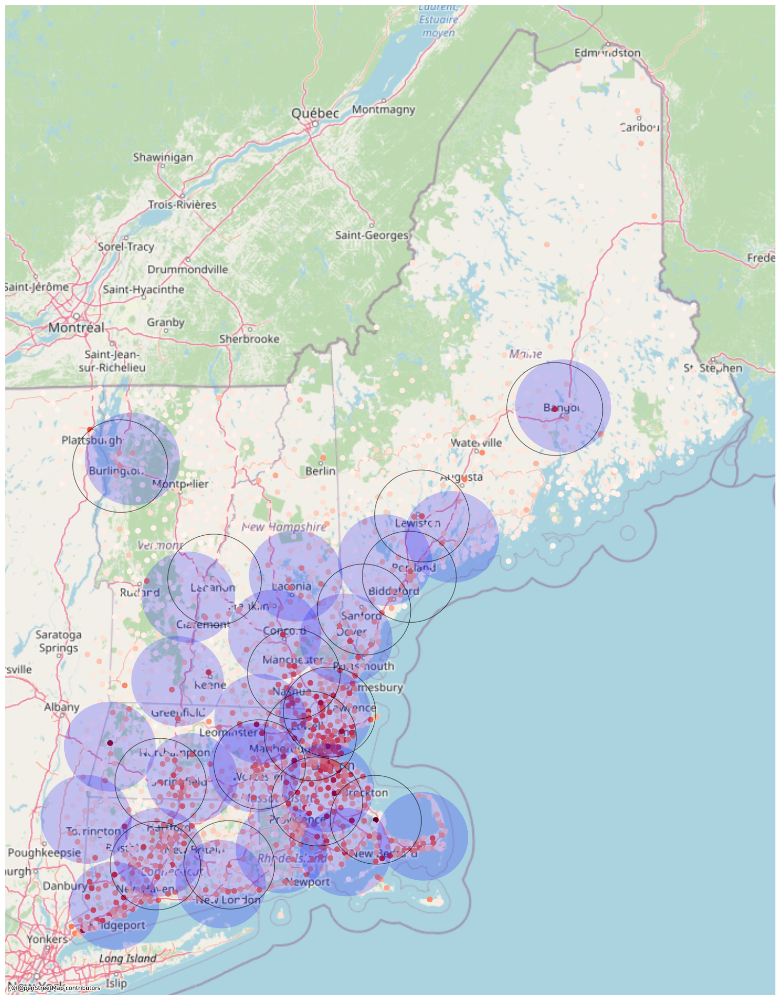

p = 0.2:


<ipython-input-9-4457085e6aa0>:96: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,


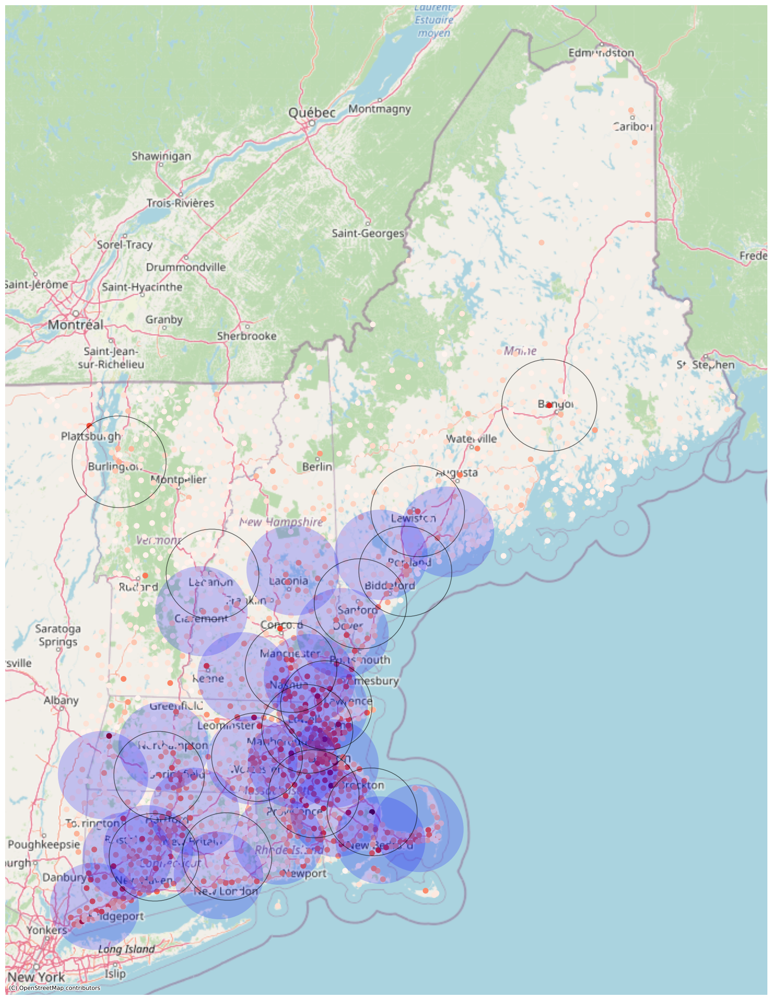

p = 0.4:


<ipython-input-9-4457085e6aa0>:96: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,


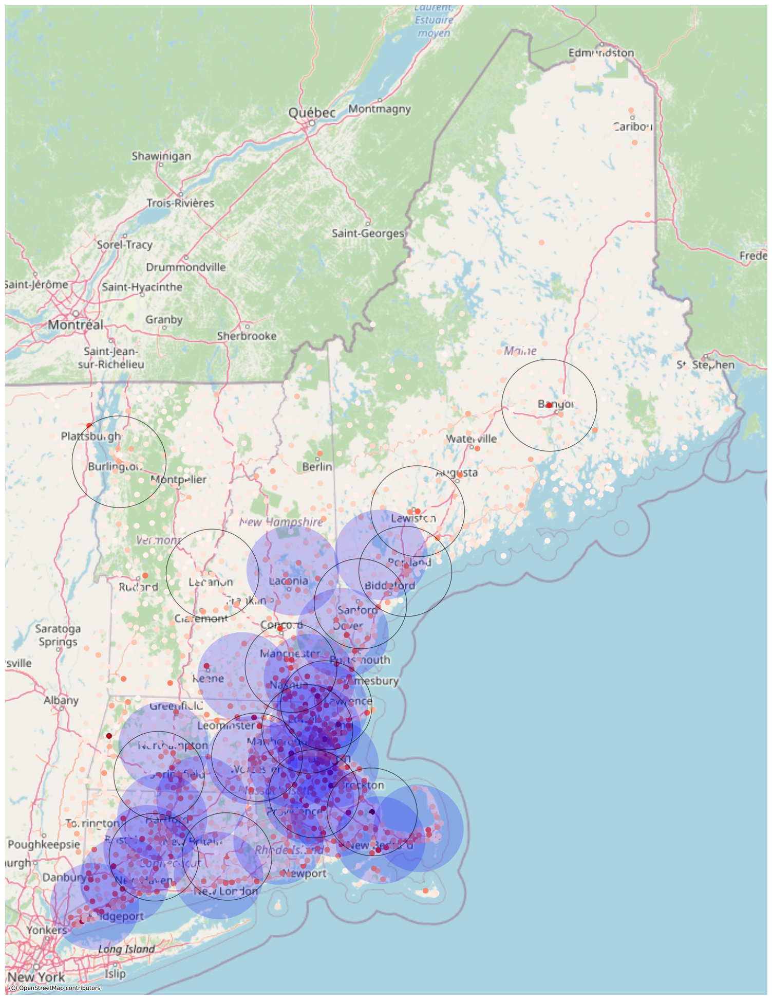

p = 0.6:


<ipython-input-9-4457085e6aa0>:96: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,


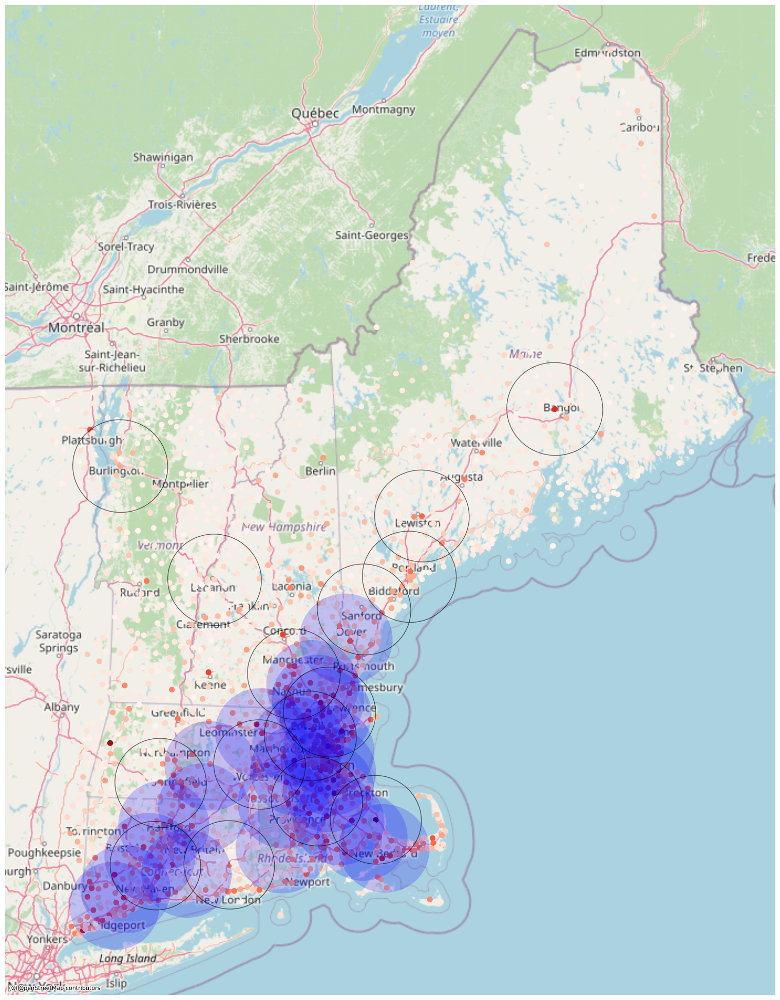

p = 0.8:


<ipython-input-9-4457085e6aa0>:96: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,


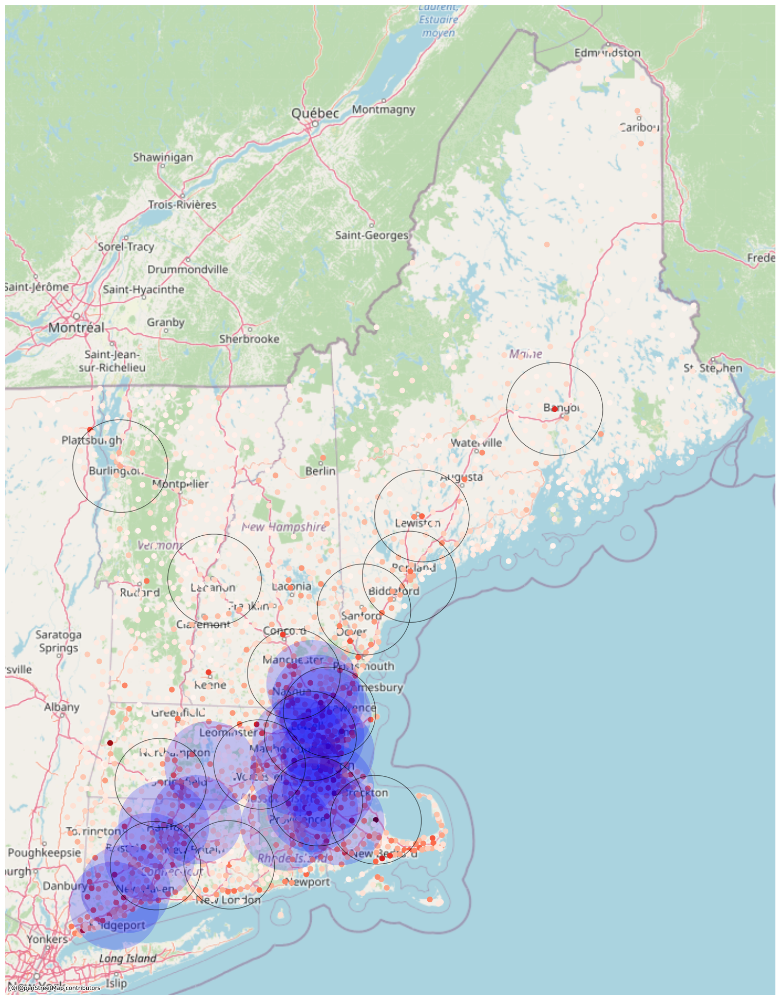

p = 0.95:


<ipython-input-9-4457085e6aa0>:96: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,


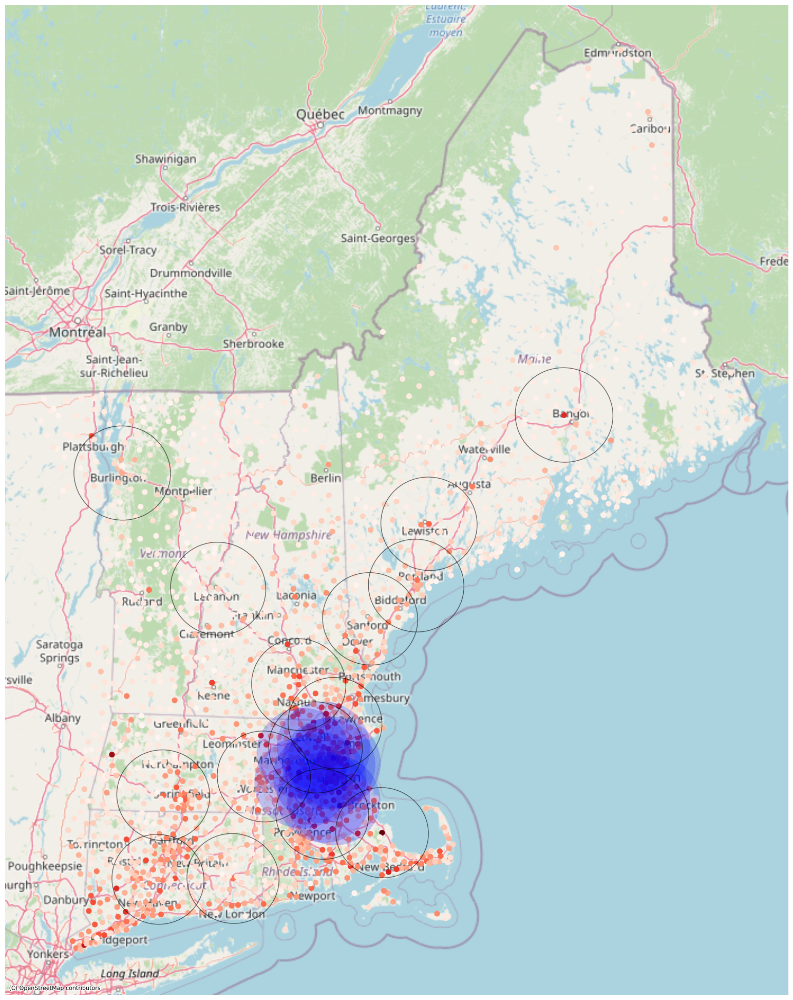

In [10]:
final_run_stats = None
batchtime = datetime.now()
for run_config in run_configs:
    final_run_stats = run_mexclp(run_config, zctas, crosswalk, notional_demand_indexed, hsas, cbc_dir, starttime=batchtime) # was zctas or zcta_intpts

In [11]:
final_run_stats

,image,image_timestamp,states,data_yr,radius,radius_units,batchtime,runtime,locations_used,locations_max,covered_pop_all_regions,zcta5,intptlat,intptlong,PATIENTS,hsanum,hsacity,hsastate
0,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,1001,42.062366,-72.625755,58.0,22058,Springfield,MA
1,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,1002,42.364059,-72.458740,69.0,22046,Northampton,MA
4,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,1007,42.279011,-72.400467,34.0,22063,Ware,MA
5,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,1008,42.190189,-72.954262,11.0,22066,Westfield,MA
6,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,1009,42.209667,-72.339745,6.0,22049,Palmer,MA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1791,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,6786,41.672733,-73.018051,26.0,7002,Bristol,CT
1792,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,6787,41.671082,-73.085045,23.0,7026,Waterbury,CT
1794,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,6791,41.761345,-73.060440,22.0,7025,Torrington,CT
1797,None,None,MA-CT-VT-ME-RI-NH,2016,20,nm,None,None,15,22,34344.0,6795,41.623894,-73.126198,40.0,7026,Waterbury,CT
